In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tnrange, tqdm_notebook
import time
import datetime
from sklearn.metrics import confusion_matrix
from scipy.stats import vonmises
#from category_encoders.target_encoder import TargetEncoder
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
tqdm_notebook().pandas()

C:\Users\10411\anaconda3\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\10411\anaconda3\lib\site-packages\numpy\.libs\libopenblas.QVLO2T66WEPI7JZ63PS3HMOHFEY472BC.gfortran-win_amd64.dll
C:\Users\10411\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  stacklevel=1)
C:\Users\10411\anaconda3\lib\site-packages\ipykernel_launcher.py:13: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  del sys.path[0]


In [3]:
def cal_null_number(data):
    total_data_number  = len(data)
    df_null_number = data.isnull().sum()
    df_null_number = df_null_number.loc[df_null_number>0]
    df_null_number = pd.DataFrame(df_null_number.sort_values(ascending=False).reset_index())
    df_null_number.columns = ['feature_name','null_total_number']
    df_null_number['null_ratio'] = round(df_null_number['null_total_number'] / total_data_number,5)
    return df_null_number
def visualize_class_distribution(df_column):
    column_value_count = df_column.value_counts()
    class_label = column_value_count.index
    total_number = column_value_count.values.sum()
    percentage_list = []
    for value in column_value_count:
        percentage = (value / total_number) * 100
        percentage_list.append(percentage)
    g = sns.barplot(class_label,percentage_list)
    for x, y in zip(class_label,percentage_list):
        plt.text(x,y+0.5,round(y,2),ha='center')
    plt.xlabel('class')
    plt.ylabel('percentage')
    plt.title('Class Distribution')
def impute_time_zero(x):
    x = str(int(x))
    if len(x) == 1:
        x = '00000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x
    if len(x) == 2:
        x = '0000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 3:
        x = '000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 4:
        x = '00' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 5:
        x = '0' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 6:
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x
def time_to_second(x):
    x = x.time()
    hour = x.hour
    minute = x.minute
    second = x.second
    total_second = 3600*hour + 60*minute + second
    return total_second

def time_to_hour(x):
    x = x.time()
    hour = x.hour
    return hour

In [4]:
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')
test_data_id = test_data['txkey']
total_data = pd.concat([train_data,test_data],sort=False)

#loctm
train_data['loctm'] = train_data['loctm'].apply(impute_time_zero)
train_data['hour'] = train_data['loctm'].apply(time_to_hour)
train_data['loctm'] = train_data['loctm'].apply(time_to_second)

pd.set_option('display.max_columns',20)
pd.set_option('display.max_rows',20)

In [4]:
cal_null_number(train_data)

,feature_name,null_total_number,null_ratio
0,flg_3dsmk,12581,0.00827
1,flbmk,12581,0.00827


In [5]:
cal_null_number(test_data)

,feature_name,null_total_number,null_ratio
0,flg_3dsmk,3715,0.00881
1,flbmk,3715,0.00881


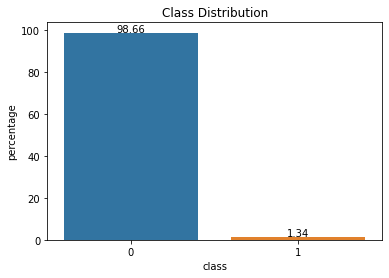

In [5]:
visualize_class_distribution(train_data['fraud_ind'])

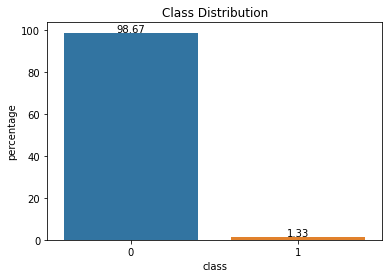

In [6]:
visualize_class_distribution(test_data['fraud_ind'])

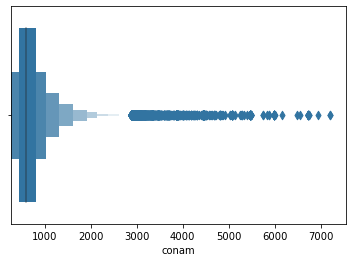

In [7]:
sns.boxenplot(x='conam',data=train_data)

In [8]:
acquic_10 = train_data['acqic'].value_counts().sort_values(ascending=False)[:10]

In [9]:
afis = train_data.groupby(by='acqic')['fraud_ind'].value_counts().rename('acqic_fraud_ind_summary').reset_index()
afis.loc[afis['fraud_ind']==1].sort_values(by='acqic_fraud_ind_summary',ascending=False)

,acqic,fraud_ind,acqic_fraud_ind_summary
2993,3348,1,4031
2856,3221,1,2455
5783,6215,1,2080
6168,6540,1,1669
5218,5720,1,1194
...,...,...,...
6073,6457,1,1
6076,6459,1,1
5491,5967,1,1
6093,6477,1,1


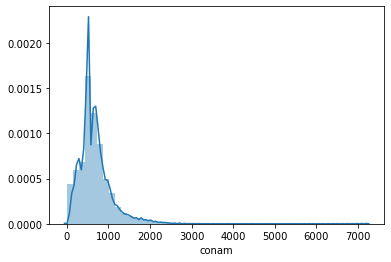

In [10]:
sns.distplot(train_data['conam'])

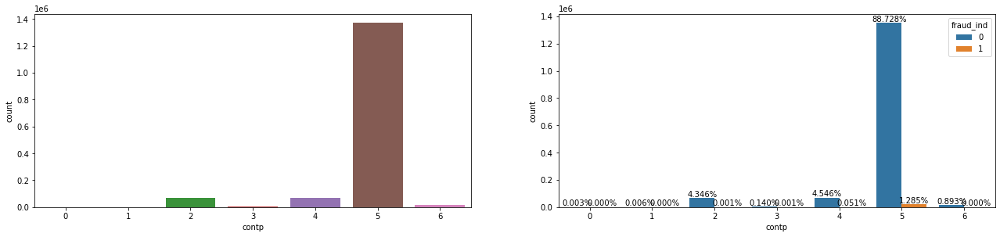

In [11]:
plt.figure(figsize=(22,10))
plt.subplot(221)
sns.countplot(x='contp',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='contp',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71]),
 <a list of 72 Text major ticklabel objects>)

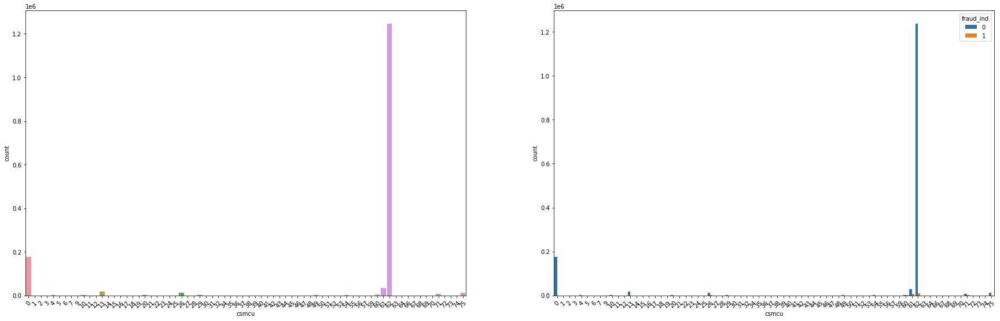

In [12]:
plt.figure(figsize=(30,20))
plt.subplot(221)
sns.countplot(x='csmcu',data=train_data)
plt.xticks(rotation=45)

plt.subplot(222)
sns.countplot(x='csmcu',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

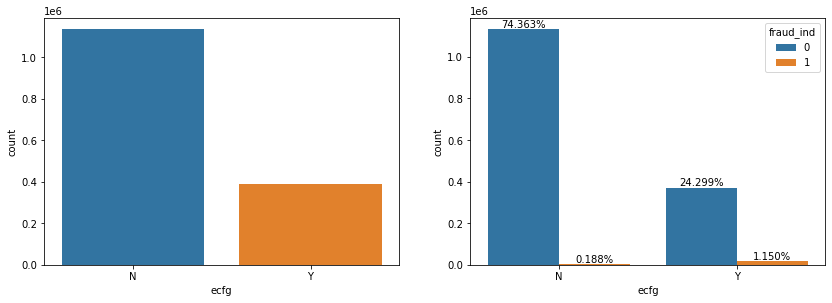

In [13]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='ecfg',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='ecfg',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

Rectangle(xy=(-0.4, 0), width=0.8, height=130022, angle=0)
Rectangle(xy=(0.6, 0), width=0.8, height=10339, angle=0)
Rectangle(xy=(1.6, 0), width=0.8, height=377669, angle=0)
Rectangle(xy=(2.6, 0), width=0.8, height=2350, angle=0)
Rectangle(xy=(3.6, 0), width=0.8, height=320502, angle=0)
Rectangle(xy=(4.6, 0), width=0.8, height=404611, angle=0)
Rectangle(xy=(5.6, 0), width=0.8, height=1978, angle=0)
Rectangle(xy=(6.6, 0), width=0.8, height=228, angle=0)
Rectangle(xy=(7.6, 0), width=0.8, height=243995, angle=0)
Rectangle(xy=(8.6, 0), width=0.8, height=30076, angle=0)
Rectangle(xy=(9.6, 0), width=0.8, height=17, angle=0)


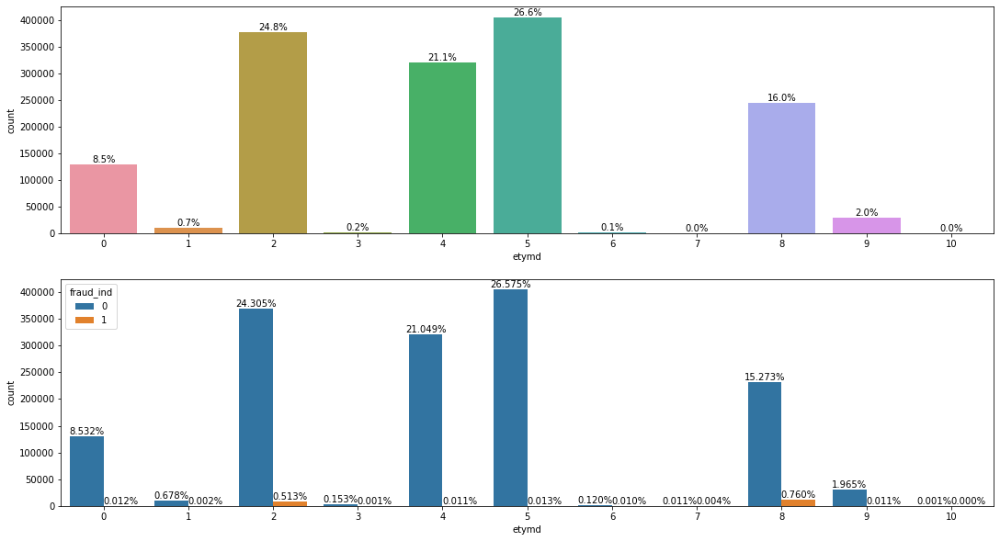

In [14]:
plt.figure(figsize=(40,10))
plt.subplot(221)
ax = sns.countplot(x='etymd',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    print(p)
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text
    
plt.subplot(223)
ax = sns.countplot(x='etymd',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

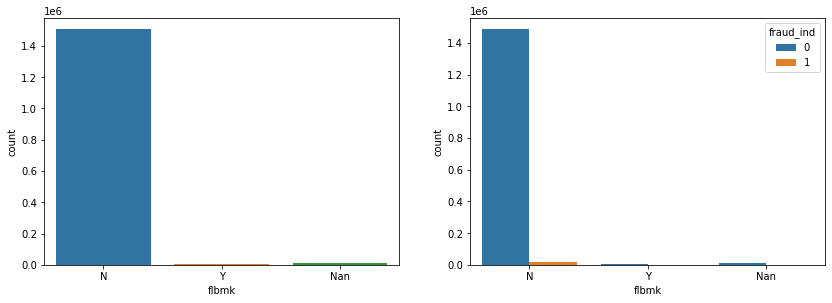

In [15]:
# nan的沒有詐騙案
train_data.loc[train_data['flbmk'].isnull(),'flbmk'] = 'Nan'

plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='flbmk',data=train_data)

plt.subplot(222)
sns.countplot(x='flbmk',hue='fraud_ind',data=train_data)

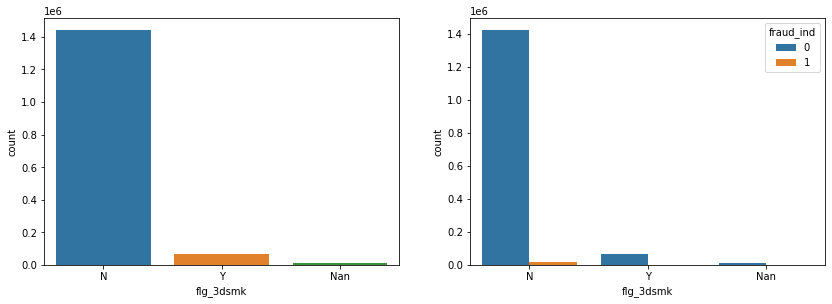

In [16]:
train_data.loc[train_data['flg_3dsmk'].isnull(),'flg_3dsmk'] = 'Nan'

plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='flg_3dsmk',data=train_data)

plt.subplot(222)
sns.countplot(x='flg_3dsmk',hue='fraud_ind',data=train_data)

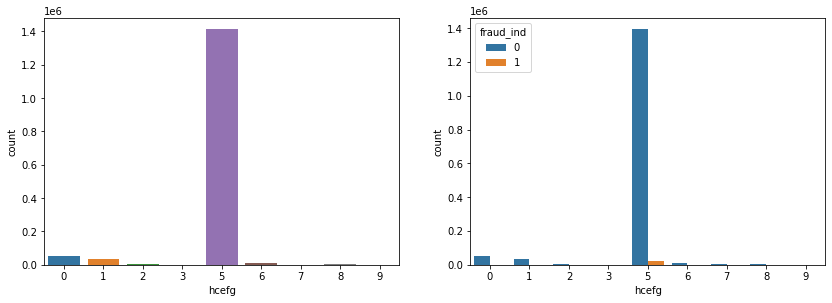

In [17]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='hcefg',data=train_data)

plt.subplot(222)
sns.countplot(x='hcefg',hue='fraud_ind',data=train_data)

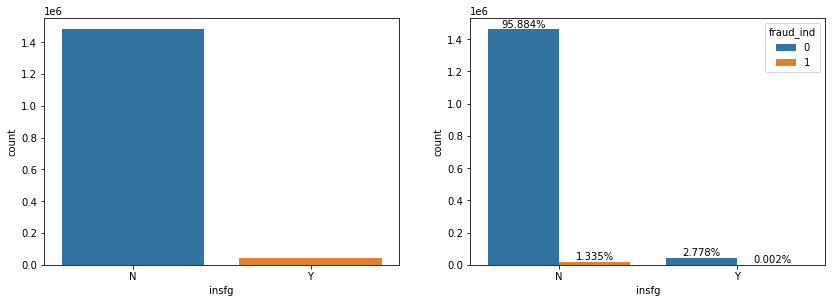

In [18]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='insfg',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='insfg',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

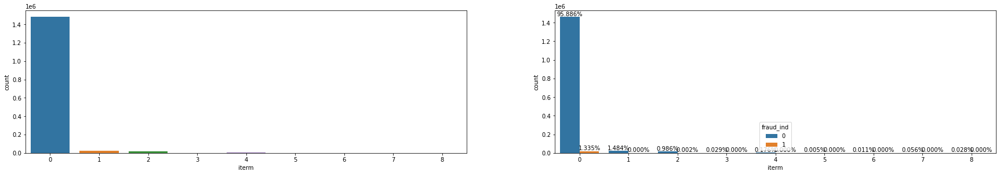

In [19]:
plt.figure(figsize=(30,10))
plt.subplot(221)
sns.countplot(x='iterm',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='iterm',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

In [20]:
# 90天的授權日期
len(train_data['locdt'].value_counts())

90

In [21]:
sorted(train_data['loctm'].unique())[-1]

86399

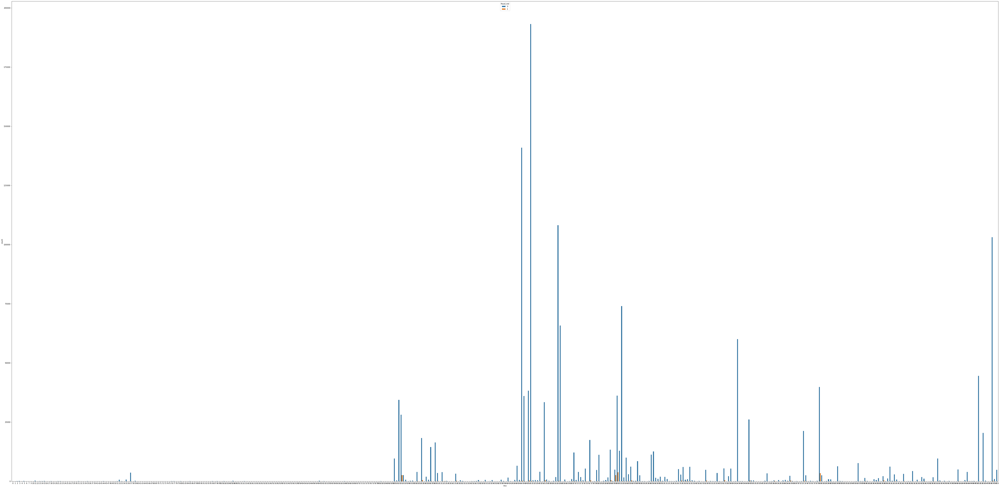

In [22]:
plt.figure(figsize=(100,50))
sns.countplot(x='mcc',hue='fraud_ind',data=train_data)

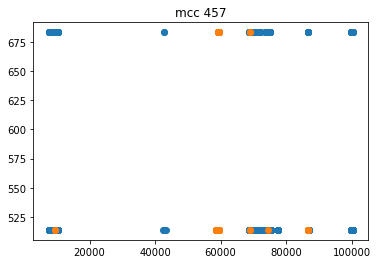

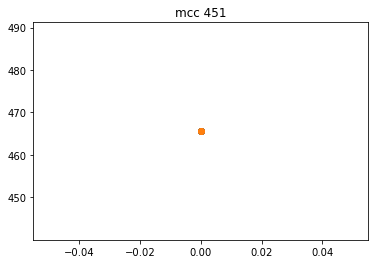

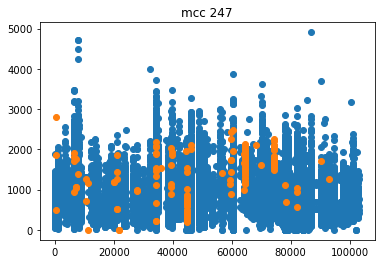

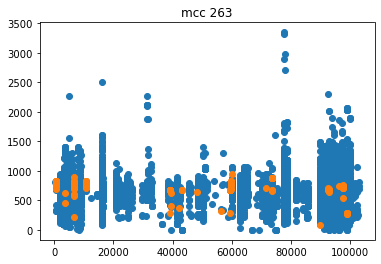

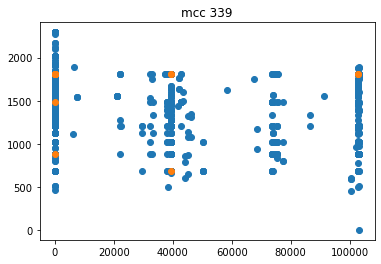

...

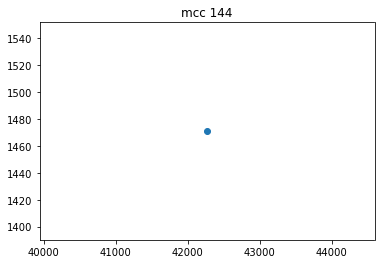

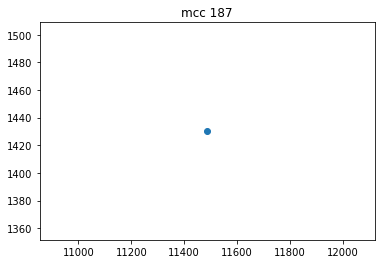

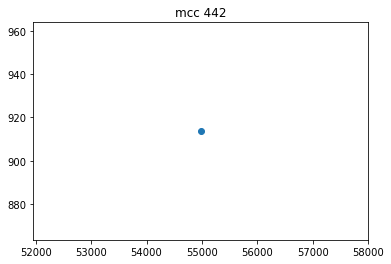

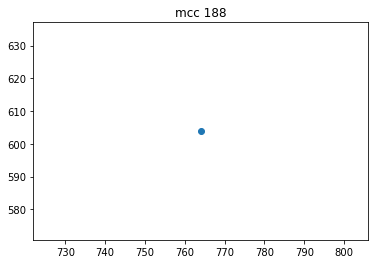

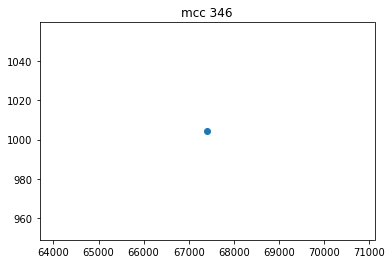

In [23]:
for mcc in train_data['mcc'].unique():
    a = train_data.loc[(train_data['mcc']==mcc)&(train_data['fraud_ind']==0)]
    b = train_data.loc[(train_data['mcc']==mcc)&(train_data['fraud_ind']==1)]
    plt.figure()
    plt.subplot()
    plt.scatter(a['mchno'],a['conam'])
    plt.scatter(b['mchno'],b['conam'])
    plt.title('mcc %s' %mcc)
    plt.show()

In [24]:
mfn = train_data.groupby(by='mchno')['fraud_ind'].sum().rename('mchno_fraud_number').reset_index()
smtn = train_data.groupby(by='mchno')['txkey'].count().rename('same_mchno_transaction_number').reset_index()
mfn = mfn.merge(smtn,on=['mchno'],how='left')
mfn['mchno_fraud_ratio'] = mfn['mchno_fraud_number'] / mfn['same_mchno_transaction_number']

In [25]:
mfn.sort_values('same_mchno_transaction_number')

,mchno,mchno_fraud_number,same_mchno_transaction_number,mchno_fraud_ratio
44657,51445,0,1,0.000000
39400,45371,0,1,0.000000
39401,45372,0,1,0.000000
73358,85257,0,1,0.000000
39407,45378,0,1,0.000000
...,...,...,...,...
74457,86584,5,20387,0.000245
51327,59333,77,32287,0.002385
47107,54238,3289,36795,0.089387
47584,54828,2681,38265,0.070064


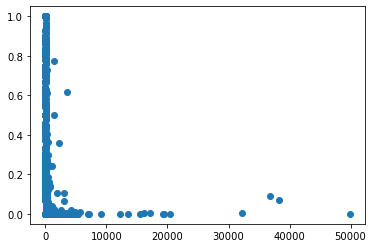

In [26]:
plt.scatter(mfn['same_mchno_transaction_number'],mfn['mchno_fraud_ratio'])

In [27]:
train_data.loc[train_data['cano']==172208]

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,...,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour
24216,6716,138557,172208,849.76,5,62,N,4,N,N,...,40,52351,247,34399,N,5820,102,0,1428578,14
115882,6812,138557,172208,855.54,5,62,N,4,N,N,...,36,62465,275,45219,N,3760,102,0,1569563,17
119852,6716,138557,172208,683.25,5,62,N,5,N,N,...,17,47212,247,34399,N,5820,102,0,1343637,13
222469,6826,138557,172208,513.36,5,62,N,5,N,N,...,61,63675,277,12692,N,5817,102,0,1655944,17
272304,6716,138557,172208,889.48,5,62,N,5,N,N,...,64,65302,251,45340,N,3619,102,0,1586463,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072762,6716,138557,172208,723.33,5,62,N,5,N,N,...,78,46337,251,45340,N,3619,102,0,1738016,12
1087598,6831,138557,172208,699.93,5,62,N,4,N,N,...,58,64738,277,29551,N,2489,102,0,1439659,17
1228363,6826,138557,172208,755.52,5,62,N,5,N,N,...,7,49636,277,12692,N,5817,102,0,1265895,13
1394015,6826,138557,172208,718.77,5,62,N,5,N,N,...,21,47266,292,16727,N,5817,102,0,1417053,13


In [28]:
train_data.loc[(train_data['mchno']==20984)&(train_data['fraud_ind']==1)].sort_values(by='mcc')

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,...,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour
1335877,3288,71959,15906,1269.53,5,62,Y,8,N,N,...,28,62895,203,20984,N,621,93,0,685956,17
600465,3288,60066,194763,1357.76,5,62,Y,8,N,N,...,43,58790,203,20984,N,621,93,0,712208,16
867411,6288,50956,167488,1264.93,5,62,Y,2,N,N,...,29,40106,210,20984,N,621,93,0,1862999,11
489702,6288,50956,167488,1264.93,5,62,Y,2,N,N,...,29,40088,210,20984,N,621,93,0,1863002,11
492680,3288,65190,8097,1555.64,5,62,Y,8,N,N,...,31,51654,210,20984,N,621,93,0,690611,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196541,3288,27289,182834,185.50,5,62,Y,8,N,N,...,19,36973,441,20984,N,621,93,2,670931,10
191636,6288,36712,151871,1675.30,5,62,Y,2,N,N,...,86,41860,441,20984,N,621,93,0,1922755,11
1232609,6288,44612,47762,1503.13,5,62,Y,2,N,N,...,57,44335,441,20984,N,621,93,0,1893483,12
1435042,3288,99427,174477,1299.00,5,62,Y,8,N,N,...,54,75293,441,20984,N,621,93,0,729924,20


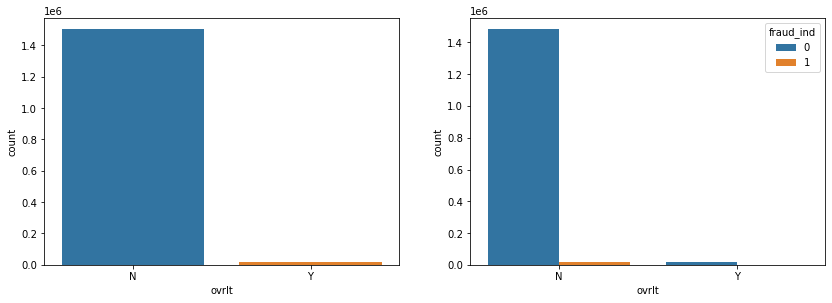

In [29]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='ovrlt',data=train_data)

plt.subplot(222)
sns.countplot(x='ovrlt',hue='fraud_ind',data=train_data)

In [30]:
ns = total_data.groupby(by=['stocn','scity'])['txkey'].count().rename('new_scity').reset_index()
ns['new_scity'] = np.arange(0,len(ns))
total_data = total_data.merge(ns,on=['stocn','scity'],how='left')
total_data['new_scity'] = total_data['new_scity'].astype('category')

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102]),
 <a list of 103 Text major ticklabel objects>)

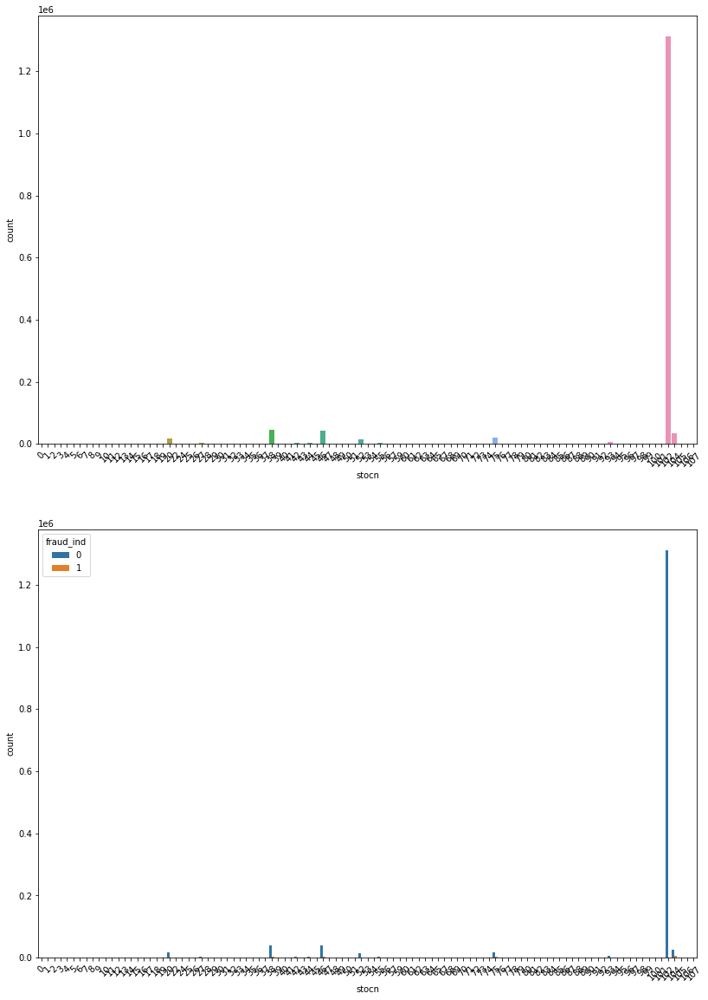

In [31]:
plt.figure(figsize=(30,20))
plt.subplot(221)
sns.countplot(x='stocn',data=train_data)
plt.xticks(rotation=45)

plt.subplot(223)
sns.countplot(x='stocn',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

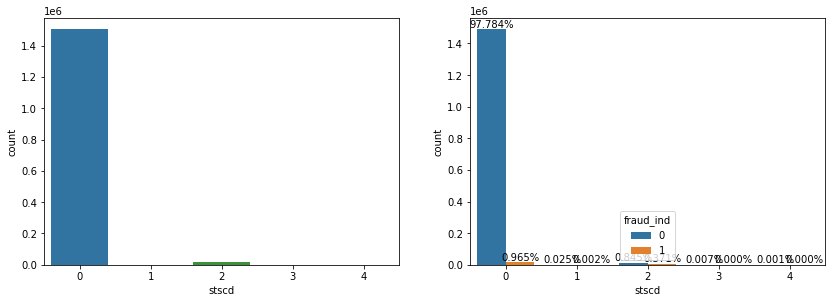

In [32]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='stscd',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='stscd',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

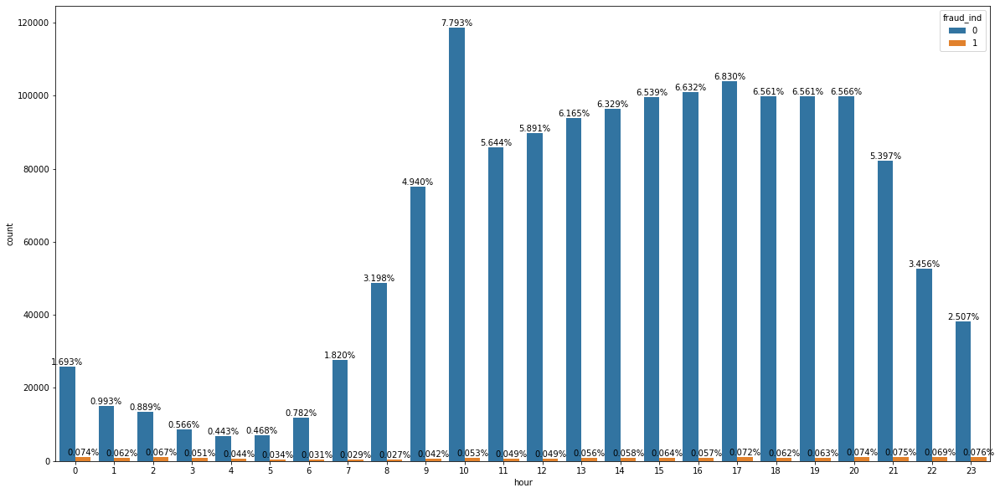

In [33]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='hour',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

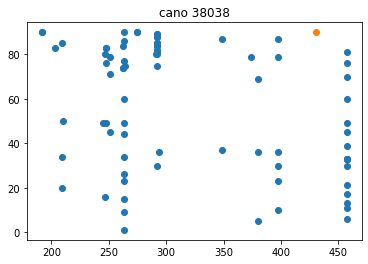

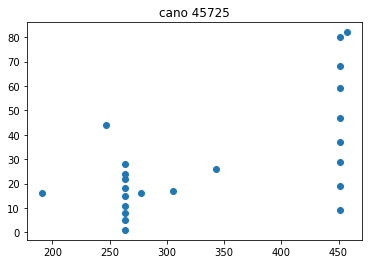

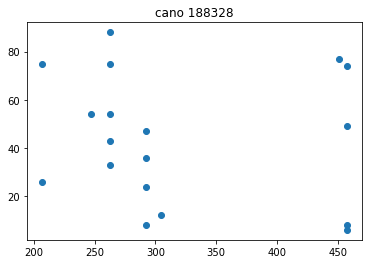

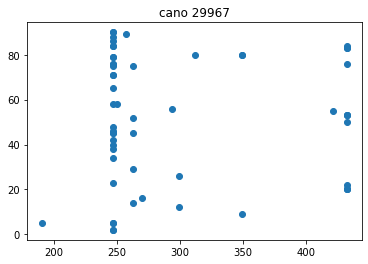

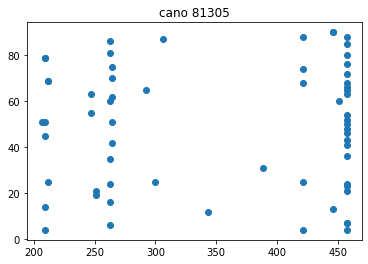

...

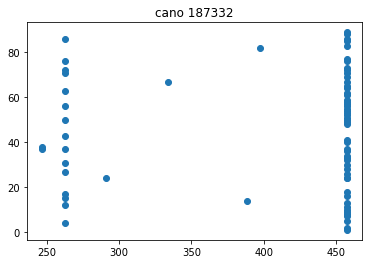

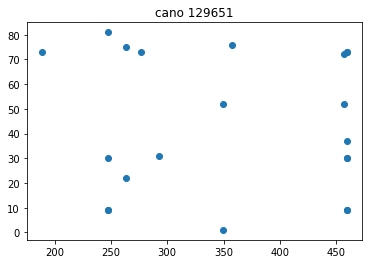

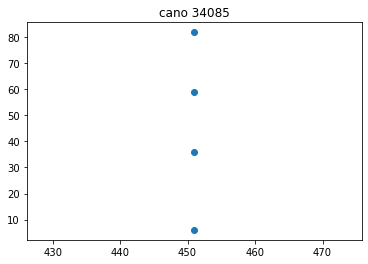

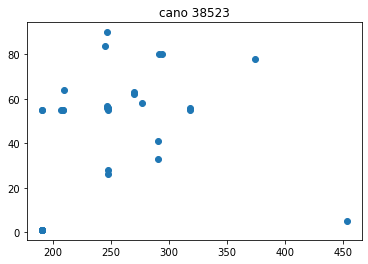

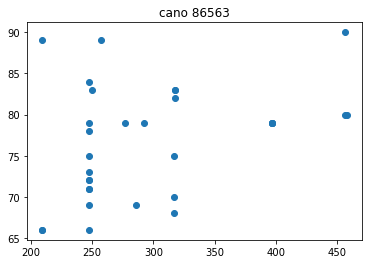

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [34]:
for cano in train_data['cano'].unique():
    a = train_data.loc[(train_data['cano']==cano)&(train_data['fraud_ind']==0)]
    b = train_data.loc[(train_data['cano']==cano)&(train_data['fraud_ind']==1)]
    plt.figure()
    plt.subplot()
    plt.scatter(a['mcc'],a['locdt'])
    plt.scatter(b['mcc'],b['locdt'])
    plt.title('cano %s' %cano)
    plt.show()

In [35]:
transaction_number = train_data.groupby('bacno')['txkey'].count().rename('same_bacno_transaction_number').reset_index()
train_data = train_data.merge(transaction_number,on='bacno',how='left')

In [36]:
fn = train_data.groupby(['bacno','same_bacno_transaction_number'])['fraud_ind'].sum().rename('fraud_number').reset_index()
mean_fn = fn.groupby('same_bacno_transaction_number')['fraud_number'].mean().reset_index()

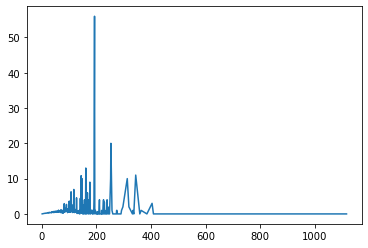

In [37]:
plt.plot(mean_fn['same_bacno_transaction_number'],mean_fn['fraud_number'])

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

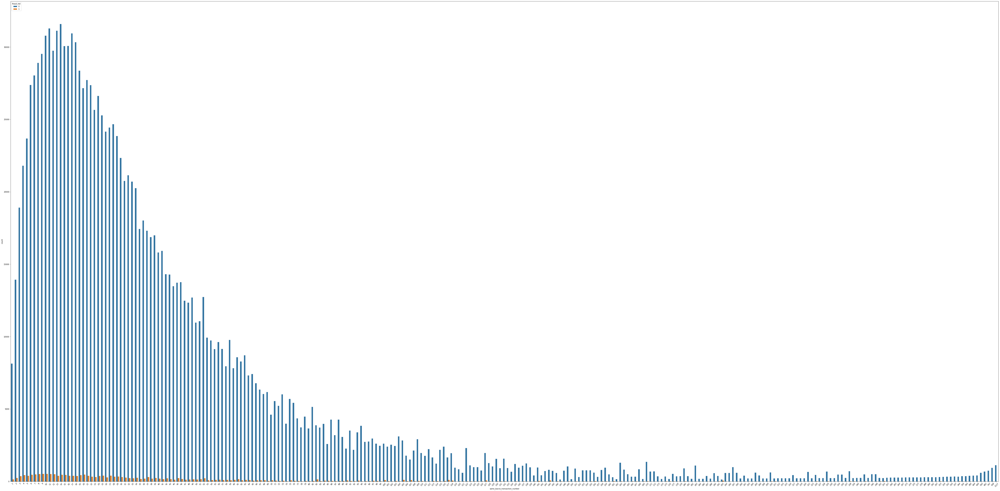

In [38]:
plt.figure(figsize=(100,50))
sns.countplot(x='same_bacno_transaction_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

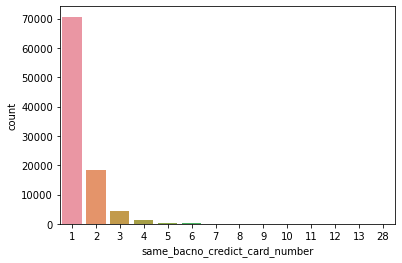

In [39]:
same_bacno_credict_card_number = train_data.groupby('bacno')['cano'].unique().rename('same_bacno_credict_card_number').reset_index()
same_bacno_credict_card_number['same_bacno_credict_card_number'] = same_bacno_credict_card_number['same_bacno_credict_card_number'].apply(lambda x : len(x))
sns.countplot(x='same_bacno_credict_card_number',data=same_bacno_credict_card_number)

In [40]:
train_data = train_data.merge(same_bacno_credict_card_number,on='bacno',how='left')

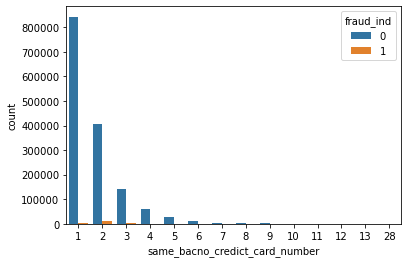

In [41]:
sns.countplot(x='same_bacno_credict_card_number',hue='fraud_ind',data=train_data)

In [42]:
train_data.groupby('same_bacno_credict_card_number')['fraud_ind'].sum()

same_bacno_credict_card_number
1     4987
2     9881
3     3378
4     1226
5      426
6      209
7      110
8       43
9       22
10      13
11       0
12       1
13       3
28      56
Name: fraud_ind, dtype: int64

In [43]:
sbctn = train_data.groupby(by=['bacno','cano'])['txkey'].count().rename('same_bacno_different_cano_trade_number').reset_index()
train_data = train_data.merge(sbctn,on=['bacno','cano'],how='left')
train_data['same_bacno_different_cano_trade_number'] = train_data['same_bacno_different_cano_trade_number'] / 60

Text(0, 0.5, 'fraud number')

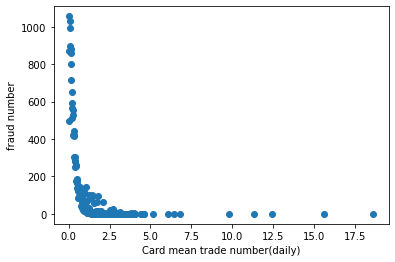

In [44]:
a = train_data.groupby(by='same_bacno_different_cano_trade_number')['fraud_ind'].sum()
plt.scatter(a.index, a.values)
plt.xlabel('Card mean trade number(daily)')
plt.ylabel('fraud number')

In [45]:
sbsducn = train_data.groupby(by=['bacno','locdt'])['cano'].unique().rename('same_bacon_same_day_use_card_number').reset_index()
sbsducn['same_bacon_same_day_use_card_number'] = sbsducn['same_bacon_same_day_use_card_number'].apply(lambda x : len(x))
train_data = train_data.merge(sbsducn,on=['bacno','locdt'],how='left')

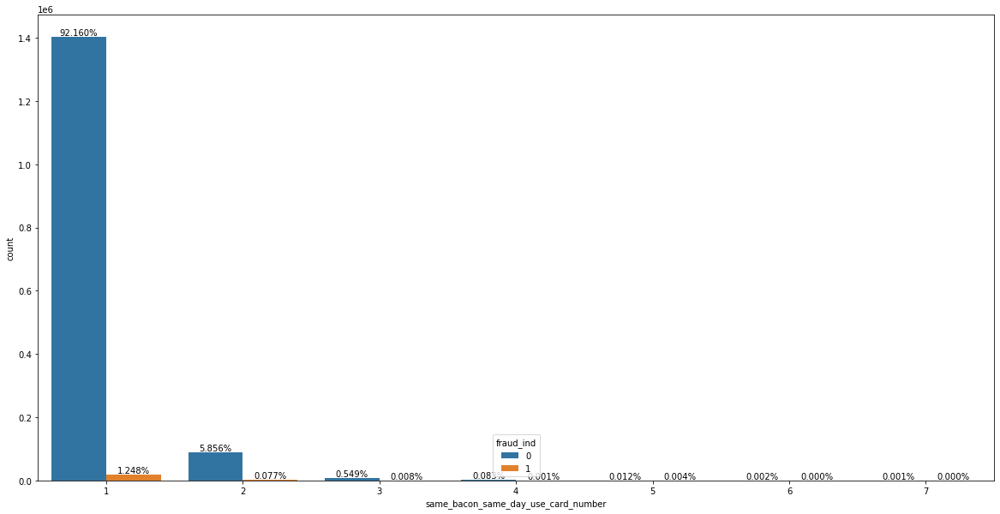

In [46]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='same_bacon_same_day_use_card_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

In [48]:
frequent_csmcu = train_data.groupby(by='cano')['csmcu'].apply(lambda x : x.mode()).rename('frequent_csmcu').reset_index()

frequent_csmcu_0 = frequent_csmcu.loc[frequent_csmcu['level_1']==0]
frequent_csmcu_0.drop('level_1',axis=1,inplace=True)
frequent_csmcu_0.columns = ['cano','frequent_csmcu_0']


frequent_csmcu_1 = frequent_csmcu.loc[frequent_csmcu['level_1']==1]
frequent_csmcu_1.drop('level_1',axis=1,inplace=True)
frequent_csmcu_1.columns = ['cano','frequent_csmcu_1']

frequent_csmcu_2 = frequent_csmcu.loc[frequent_csmcu['level_1']==2]
frequent_csmcu_2.drop('level_1',axis=1,inplace=True)
frequent_csmcu_2.columns = ['cano','frequent_csmcu_2']

frequent_csmcu_3 = frequent_csmcu.loc[frequent_csmcu['level_1']==3]
frequent_csmcu_3.drop('level_1',axis=1,inplace=True)
frequent_csmcu_3.columns = ['cano','frequent_csmcu_3']

final_frequent_csmcu = frequent_csmcu_0.merge(frequent_csmcu_1,on='cano',how='left')
final_frequent_csmcu = final_frequent_csmcu.merge(frequent_csmcu_2,on='cano',how='left')
final_frequent_csmcu = final_frequent_csmcu.merge(frequent_csmcu_3,on='cano',how='left')

train_data = train_data.merge(final_frequent_csmcu,on='cano',how='left')

C:\Users\10411\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [49]:
frequent_stocn = train_data.groupby(by='cano')['stocn'].apply(lambda x : x.mode()).rename('frequent_stocn').reset_index()

In [50]:
frequent_stocn['level_1'].value_counts()

0    129413
1      2321
2       240
3        19
4         1
Name: level_1, dtype: int64

In [51]:
frequent_stocn = train_data.groupby(by='cano')['stocn'].apply(lambda x : x.mode()).rename('frequent_stocn').reset_index()

frequent_stocn_0 = frequent_stocn.loc[frequent_stocn['level_1']==0]
frequent_stocn_0.drop('level_1',axis=1,inplace=True)
frequent_stocn_0.columns = ['cano','frequent_stocn_0']


frequent_stocn_1 = frequent_stocn.loc[frequent_stocn['level_1']==1]
frequent_stocn_1.drop('level_1',axis=1,inplace=True)
frequent_stocn_1.columns = ['cano','frequent_stocn_1']

frequent_stocn_2 = frequent_stocn.loc[frequent_stocn['level_1']==2]
frequent_stocn_2.drop('level_1',axis=1,inplace=True)
frequent_stocn_2.columns = ['cano','frequent_stocn_2']

frequent_stocn_3 = frequent_stocn.loc[frequent_stocn['level_1']==3]
frequent_stocn_3.drop('level_1',axis=1,inplace=True)
frequent_stocn_3.columns = ['cano','frequent_stocn_3']

frequent_stocn_4 = frequent_stocn.loc[frequent_stocn['level_1']==4]
frequent_stocn_4.drop('level_1',axis=1,inplace=True)
frequent_stocn_4.columns = ['cano','frequent_stocn_4']

final_frequent_stocn = frequent_stocn_0.merge(frequent_stocn_1,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_2,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_3,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_4,on='cano',how='left')

train_data = train_data.merge(final_frequent_stocn,on='cano',how='left')

In [52]:
def find_difference_csmcu_stocn(x):
    is_difference_csmcu_stocn = 0
    csmcu_list = []
    stocn_list = []
    csmcu_list.append(x['frequent_csmcu_0'])
    stocn_list.append(x['frequent_stocn_0'])
    if pd.isnull(x['frequent_csmcu_1']) == False:
        csmcu_list.append(x['frequent_csmcu_1'])
    if pd.isnull(x['frequent_csmcu_2']) == False:
        csmcu_list.append(x['frequent_csmcu_2'])
    if pd.isnull(x['frequent_csmcu_3']) == False:
        csmcu_list.append(x['frequent_csmcu_3'])
    if x['csmcu'] not in csmcu_list:
        is_difference_csmcu_stocn = 1
    
    if pd.isnull(x['frequent_stocn_1']) == False:
        stocn_list.append(x['frequent_stocn_1'])
    if pd.isnull(x['frequent_stocn_2']) == False:
        stocn_list.append(x['frequent_stocn_2'])
    if pd.isnull(x['frequent_stocn_3']) == False:
        stocn_list.append(x['frequent_stocn_3'])
    if pd.isnull(x['frequent_stocn_4']) == False:
        stocn_list.append(x['frequent_stocn_4'])
    if x['stocn'] not in stocn_list:
        is_difference_csmcu_stocn = 1
    
    return is_difference_csmcu_stocn

In [56]:
train_data['is_difference_csmcu_stocn'] = train_data.progress_apply(find_difference_csmcu_stocn,axis=1)
train_data.groupby('is_difference_csmcu_stocn')['fraud_ind'].value_counts()

is_difference_csmcu_stocn  fraud_ind
0                          0            1266877
                           1               9504
1                          0             234555
                           1              10851
Name: fraud_ind, dtype: int64

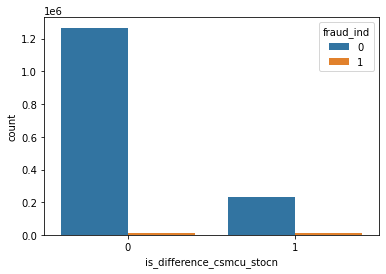

In [57]:
sns.countplot(x='is_difference_csmcu_stocn',hue='fraud_ind',data=train_data)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73]),
 <a list of 74 Text major ticklabel objects>)

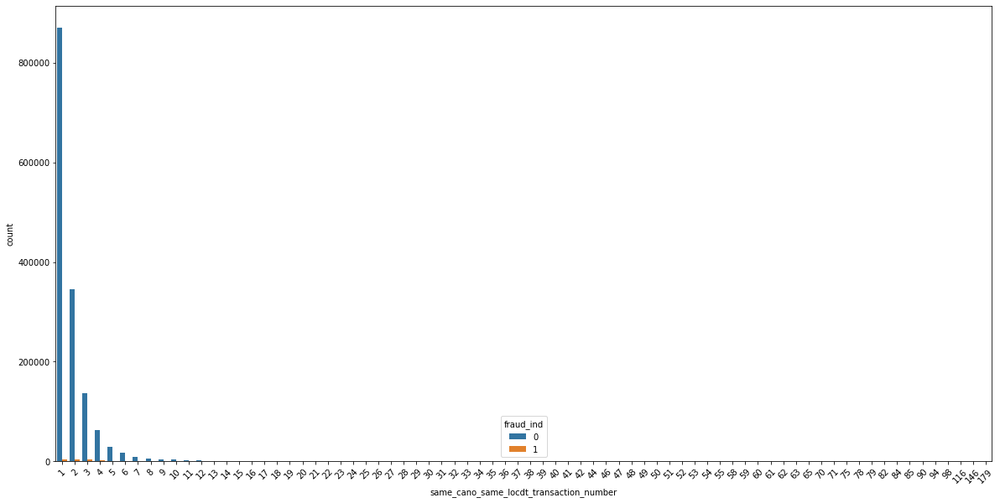

In [58]:
sctn = train_data.groupby(by=['cano','locdt'])['txkey'].count().rename('same_cano_same_locdt_transaction_number').reset_index()
train_data = train_data.merge(sctn,on=['cano','locdt'],how='left')
plt.figure(figsize=(20,10))
sns.countplot(x='same_cano_same_locdt_transaction_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

In [60]:
scslcn = train_data.groupby(by=['cano','locdt'])['csmcu'].unique().rename('same_cano_same_locdt_csmcu_number').reset_index()
scslcn['same_cano_same_locdt_csmcu_number'] = scslcn['same_cano_same_locdt_csmcu_number'].apply(lambda x : len(x))
train_data = train_data.merge(scslcn,on=['cano','locdt'],how='left')

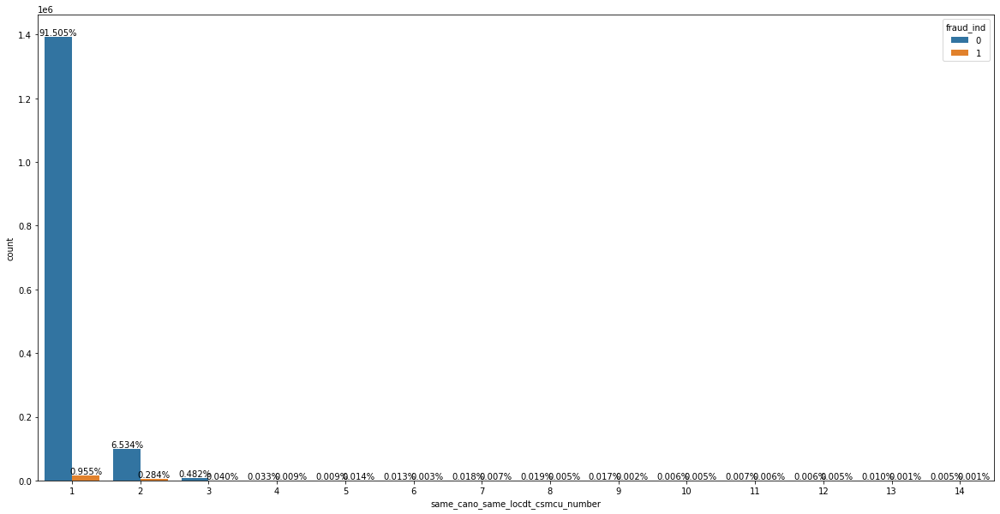

In [61]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='same_cano_same_locdt_csmcu_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

In [63]:
sbmstn = train_data.groupby(by=['cano','mcc'])['txkey'].count().rename('same_bacno_mcc_separate_trade_number').reset_index()
train_data = train_data.merge(sbmstn,on=['cano','mcc'],how='left')

In [64]:
sctn = train_data.groupby(by=['cano'])['txkey'].count().rename('same_cano_transaction_number').reset_index()
train_data = train_data.merge(sctn,on=['cano'],how='left')

In [65]:
train_data['same_bacno_mcc_trade_ratio'] = train_data['same_bacno_mcc_separate_trade_number'] / train_data['same_cano_transaction_number']

In [66]:
a = train_data.groupby(by='same_bacno_mcc_separate_trade_number')['fraud_ind'].sum()
a = a.reset_index()
a = a.rename(columns = {'same_bacno_mcc_separate_trade_number': "same_card_buy_mcc_number", "fraud_ind": "fraud number"})

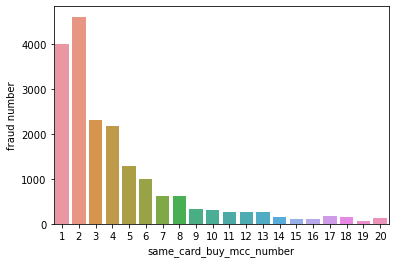

In [67]:
sns.barplot(x="same_card_buy_mcc_number", y="fraud number", data=a[:20])

In [68]:
sorted_train_data = train_data.sort_values(by=['cano','locdt','loctm'])

first_train_data = train_data.sort_values(by=['locdt','loctm']).groupby(by='cano').first().reset_index()
first_train_data['is_first'] = 1

sorted_train_data['shift_locdt'] = sorted_train_data['locdt'].shift(1).fillna(0)

sorted_train_data['shift_loctm'] = sorted_train_data['loctm'].shift(1).fillna(0)

sorted_train_data['difference_locdt'] = sorted_train_data['locdt'] - sorted_train_data['shift_locdt']
sorted_train_data['difference_loctm'] = sorted_train_data['loctm'] - sorted_train_data['shift_loctm']
sorted_train_data['same_cano_total_difference_second'] = 86400 * sorted_train_data['difference_locdt'] + sorted_train_data['difference_loctm']

sorted_train_data = sorted_train_data.merge(first_train_data[['txkey','is_first']],on='txkey',how='left')
sorted_train_data['is_first'] = sorted_train_data['is_first'].fillna(0)

sorted_train_data.loc[sorted_train_data['is_first']==1,'same_cano_total_difference_second'] = -1
train_data = train_data.merge(sorted_train_data[['txkey','same_cano_total_difference_second']],on='txkey',how='left')

In [69]:
sorted_train_data.groupby(by='is_first')['fraud_ind'].value_counts()

is_first  fraud_ind
0.0       0            1373281
          1              19093
1.0       0             128151
          1               1262
Name: fraud_ind, dtype: int64

In [70]:
scslml = train_data.groupby(by=['cano'])['conam'].mean().rename('same_cano_mean_conam').reset_index()
train_data = train_data.merge(scslml,on=['cano'],how='left')

scslsl = train_data.groupby(by=['cano'])['conam'].std().rename('same_cano_std_conam').reset_index()
train_data = train_data.merge(scslsl,on=['cano'],how='left')
train_data['same_cano_std_conam'] = train_data['same_cano_std_conam'].fillna(0)

train_data['same_cano_ci_lower_bound_conam'] = train_data['same_cano_mean_conam'] - 2 * train_data['same_cano_std_conam']
train_data['same_cano_ci_upper_bound_conam'] = train_data['same_cano_mean_conam'] + 2 * train_data['same_cano_std_conam']

train_data.loc[(train_data['conam']>=train_data['same_cano_ci_lower_bound_conam'])&(train_data['conam']<=train_data['same_cano_ci_upper_bound_conam']),'is_ci_conam'] = 1
train_data['is_ci_conam'] = train_data['is_ci_conam'].fillna(0)

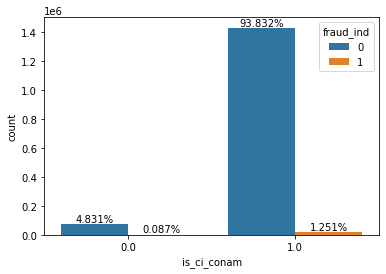

In [71]:
ax = sns.countplot(x='is_ci_conam',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text